# Ploting

Prof. Daniel de Abreu Pereira Uhr

### Conteúdo

* Gráfico de Dispersão
* Outras Formas de Visualização Alternativas


### Referências

[1] E Starr, B Goldfarb, Binned Scatterplots: uma ferramenta simples para tornar a pesquisa mais fácil e melhor (2020), Strategic Management Journal.
[2] MD Cattaneo, RK Crump, MH Farrell, Y. Feng, On Binscatter (2021), documento de trabalho.
[3] P. Goldsmith-Pinkham, Aula 6. Regressão Linear II: Semiparametria e Visualização , Curso de Doutorado em Métricas Aplicadas.

Nós usaremos dados Scraped do AirBnb para a cidade de Bolonha. Os dados estão disponíveis gratuitamente em Inside AirBnb : http://insideairbnb.com/get-the-data.html .

Usaremos 2 conjuntos de dados:

* conjunto de dados de listagem: contém informações de nível de listagem
* conjunto de dados de preços: contém dados de preços ao longo do tempo


Nós os importamos e limpamos com um script. Se quiser mais detalhes, dê uma olhada nas seções de exploração de dados e de manipulação de dados.

In [10]:
import numpy as np
import pandas as pd

import folium
import geopandas
import contextily
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns

## Introdução 

A biblioteca padrão para plotagem em python é matplotlib. No entanto, um pacote mais moderno que se baseia nela é seaborn.

Começamos dizendo ao notebook para exibir os gráficos em linha.

In [11]:
%matplotlib inline

Outra configuração importante é a resolução do gráfico. Nós o configuramos para retinater gráficos de alta resolução.

In [12]:
%config InlineBackend.figure_format = 'retina'

In [13]:
plt.style.use('seaborn')

OSError: 'seaborn' is not a valid package style, path of style file, URL of style file, or library style name (library styles are listed in `style.available`)

In [14]:
mpl.rcParams['figure.figsize'] = (10,6)
mpl.rcParams['axes.labelsize'] = 16
mpl.rcParams['axes.titlesize'] = 18
mpl.rcParams['axes.titleweight'] = 'bold'
mpl.rcParams['figure.titlesize'] = 18
mpl.rcParams['figure.titleweight'] = 'bold'
mpl.rcParams['axes.titlepad'] = 20
mpl.rcParams['legend.facecolor'] = 'w'

Você pode escolher definir um tema geral usando plt.style.use().

Lista de temas: "https://matplotlib.org/3.5.1/gallery/style_sheets/style_sheets_reference.html"



In [53]:
import numpy as np
import pandas as pd

import folium
import geopandas
import contextily
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns

In [54]:
# Import listings data
url_listings = "http://data.insideairbnb.com/italy/emilia-romagna/bologna/2021-12-17/data/listings.csv.gz"
df_listings = pd.read_csv(url_listings)

# Import pricing data
url_prices = "http://data.insideairbnb.com/italy/emilia-romagna/bologna/2021-12-17/data/calendar.csv.gz"
df_prices = pd.read_csv(url_prices, compression="gzip")

# Cleaning prices data
df_prices['price'] = df_prices['price'].str.replace('[$|,]', '', regex=True).astype(float)
df_prices['date'] = pd.to_datetime(df_prices['date'], format='%Y-%m-%d')
df_prices['available'] = df_prices['available']=='f'

# Cleaning listings data
df_listings['price'] = df_listings['price'].str.replace('[$|,]', '', regex=True).astype(float)
df_listings = df_listings[['id', 'name', 'neighbourhood_cleansed', 'latitude', 'longitude', 'price',
                               'host_id', 'host_name', 'host_response_time', 'host_response_rate', 'host_acceptance_rate',
                               'property_type', 'room_type', 'accommodates', 'bathrooms', 'bedrooms', 'beds', 'amenities',
                               'number_of_reviews', 'reviews_per_month', 'first_review', 'last_review', 'review_scores_rating']]

df_listings = df_listings.rename(columns={'id': 'listing_id',
                                              'name': 'listing_title',
                                              'price': 'mean_price',
                                              'neighbourhood_cleansed': 'neighborhood'})

# Merge
df = pd.merge(df_listings, df_prices, on='listing_id', how='inner')

In [10]:
df_listings, df_prices, df = import_data()

In [11]:
%matplotlib inline

In [12]:
%config InlineBackend.figure_format = 'retina'

In [13]:
plt.style.use('seaborn')

C:\Users\danie\AppData\Local\Temp\ipykernel_1256\240305066.py:1: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn')


In [14]:
mpl.rcParams['figure.figsize'] = (10,6)
mpl.rcParams['axes.labelsize'] = 16
mpl.rcParams['axes.titlesize'] = 18
mpl.rcParams['axes.titleweight'] = 'bold'
mpl.rcParams['figure.titlesize'] = 18
mpl.rcParams['figure.titleweight'] = 'bold'
mpl.rcParams['axes.titlepad'] = 20
mpl.rcParams['legend.facecolor'] = 'w'

In [15]:
df_listings['log_price'] = np.log(1+df_listings['mean_price'])

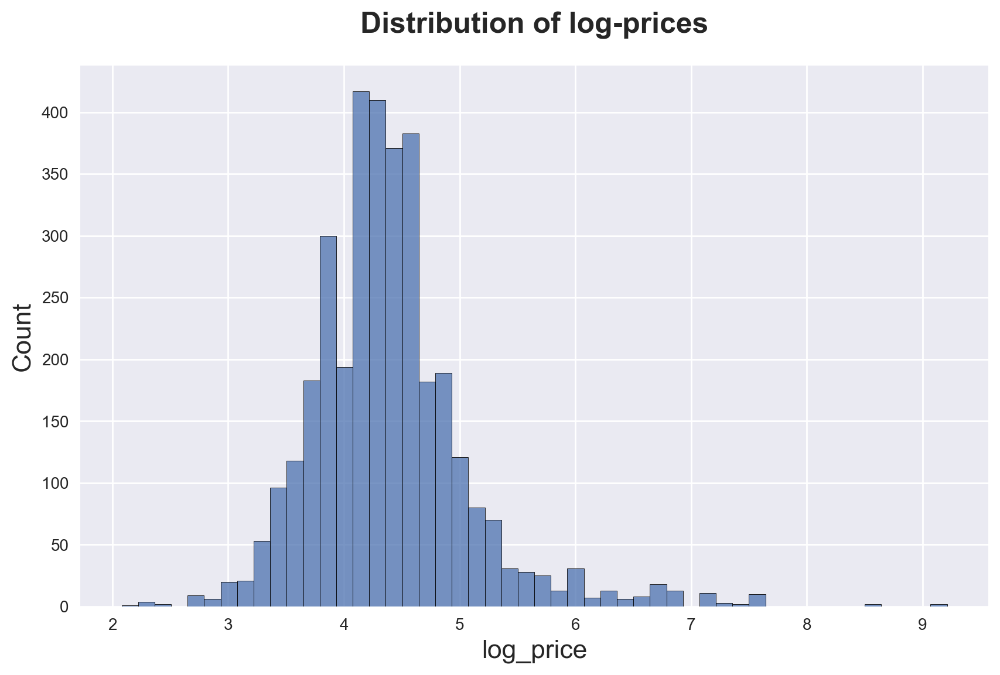

In [16]:
sns.histplot(df_listings['log_price'], bins=50)\
.set(title='Distribution of log-prices');

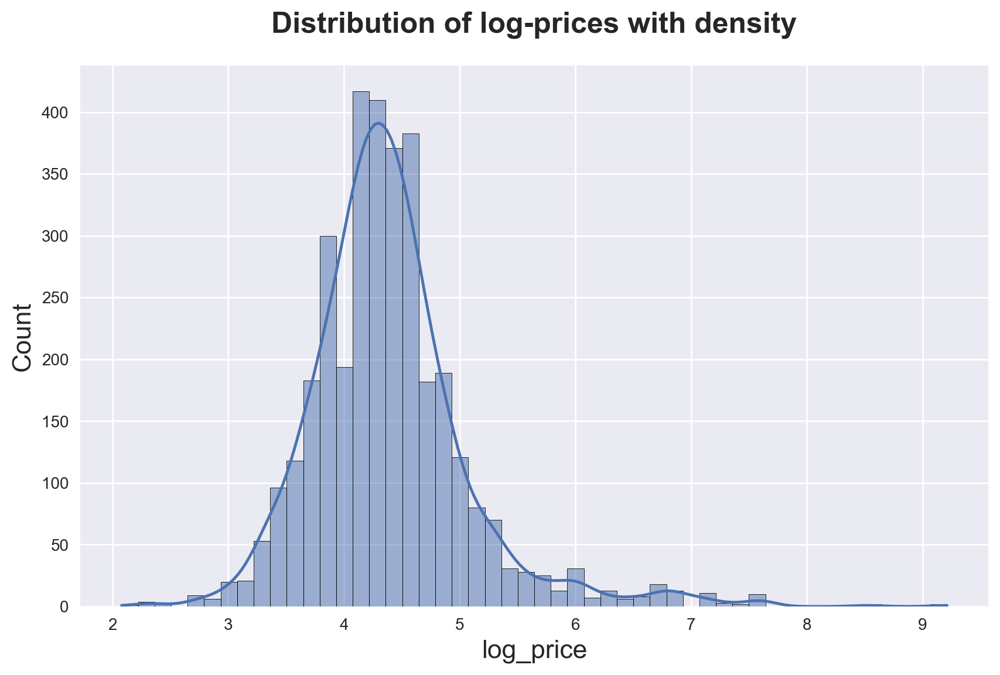

In [17]:
sns.histplot(df_listings['log_price'], bins=50, kde=True)\
.set(title='Distribution of log-prices with density');

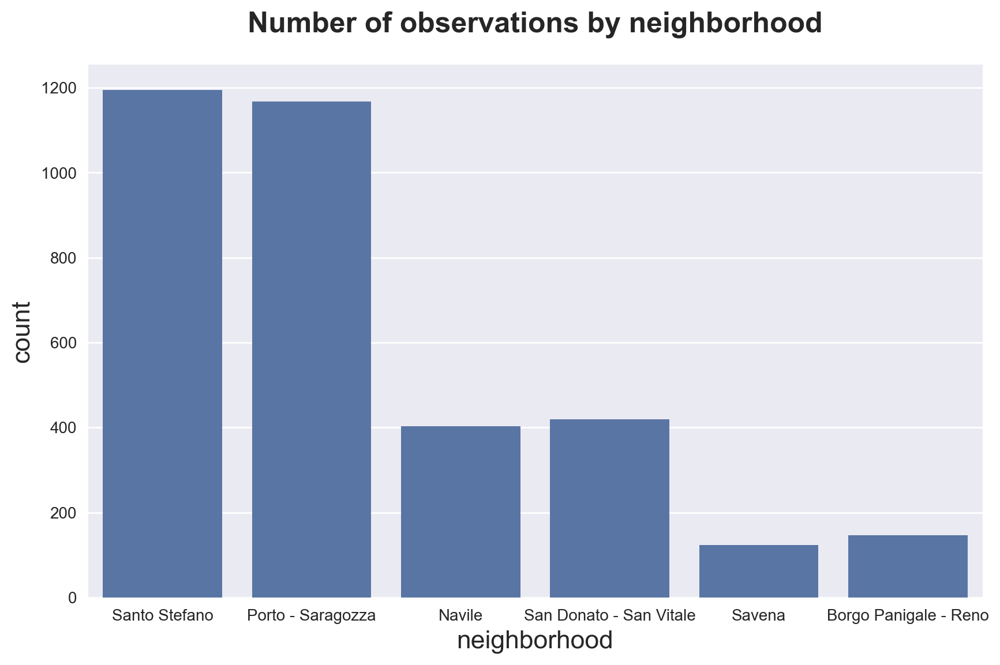

In [18]:
sns.countplot(x="neighborhood", data=df_listings)\
.set(title='Number of observations by neighborhood');

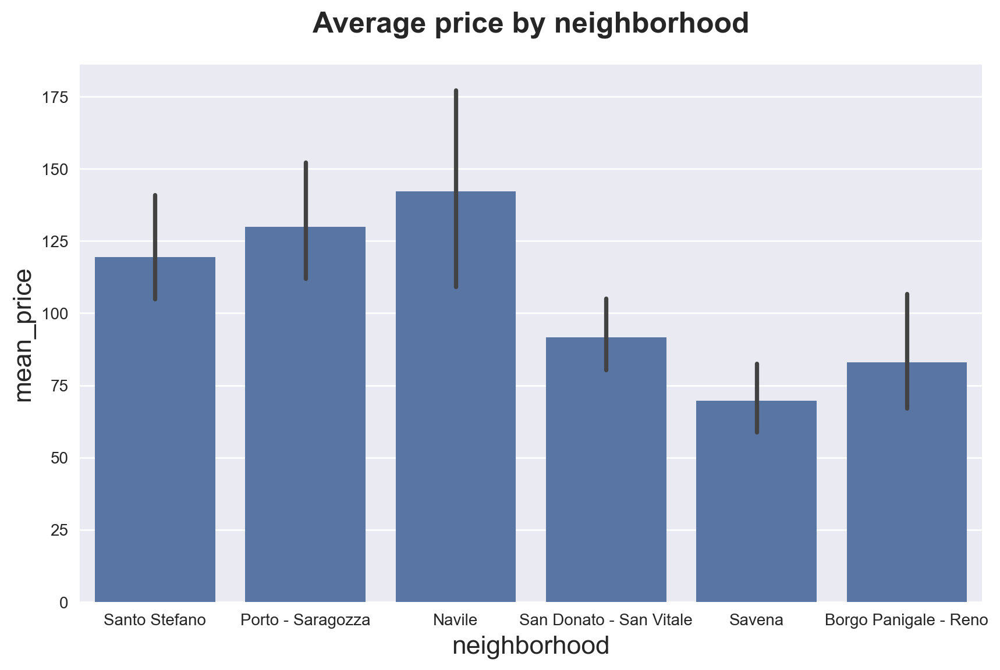

In [19]:
sns.barplot(x="neighborhood", y="mean_price", data=df_listings)\
.set(title='Average price by neighborhood');

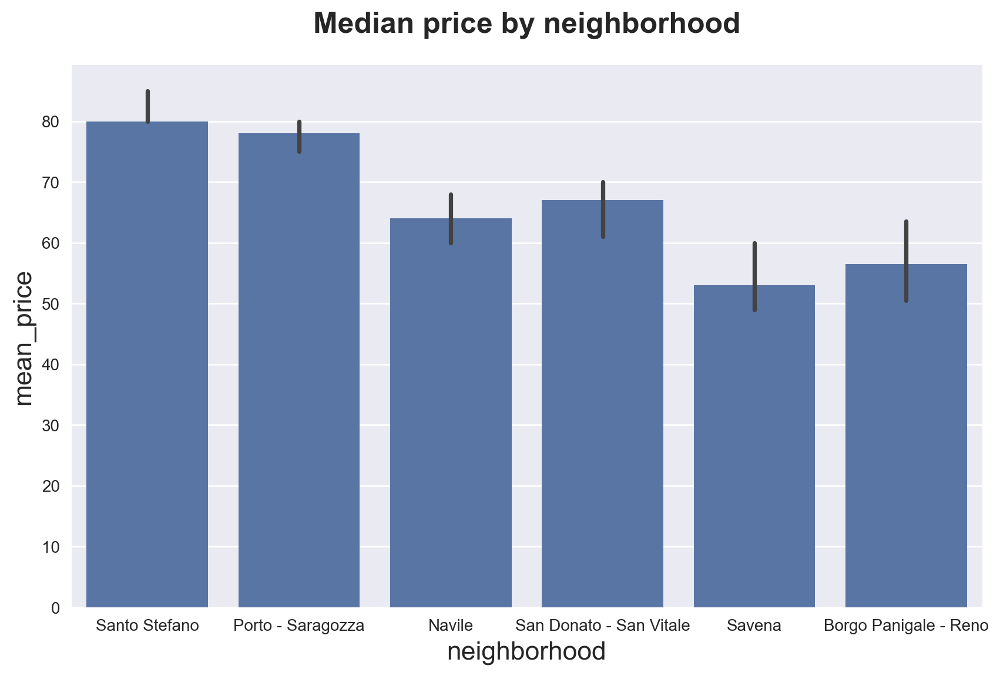

In [20]:
sns.barplot(x="neighborhood", y="mean_price", data=df_listings, estimator=np.median)\
.set(title='Median price by neighborhood');

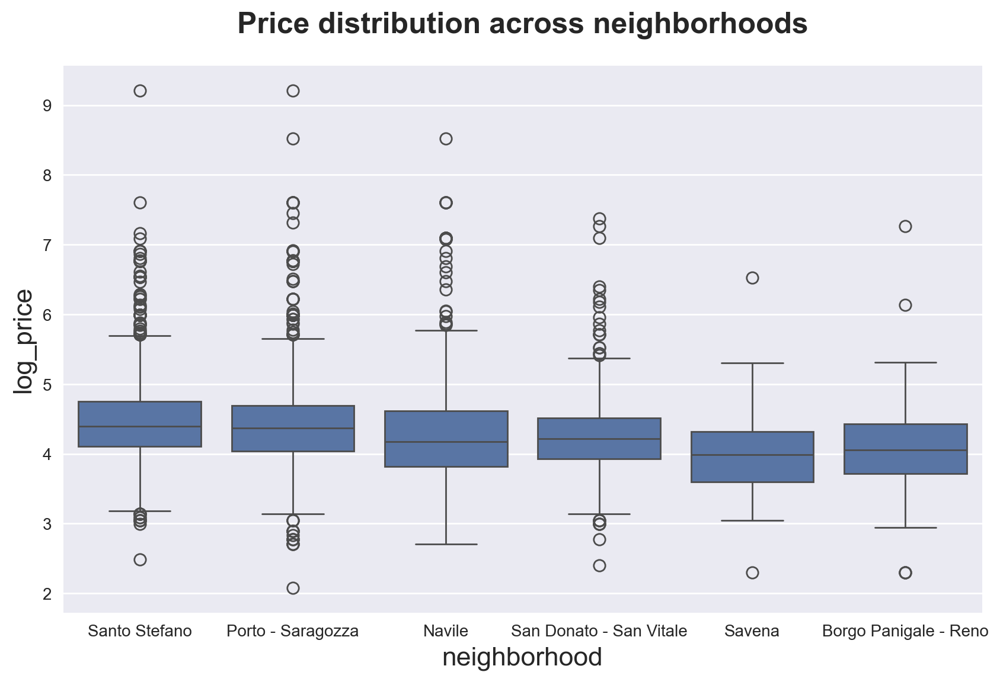

In [21]:
sns.boxplot(x="neighborhood", y="log_price", data=df_listings)\
.set(title='Price distribution across neighborhoods');

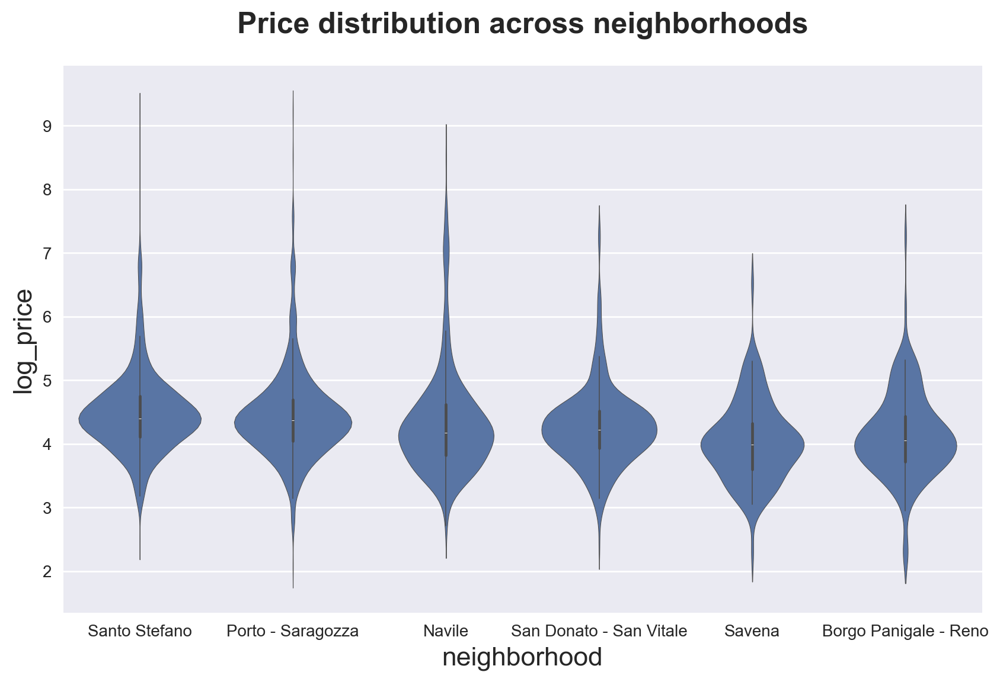

In [22]:
sns.violinplot(x="neighborhood", y="log_price", data=df_listings)\
.set(title='Price distribution across neighborhoods');

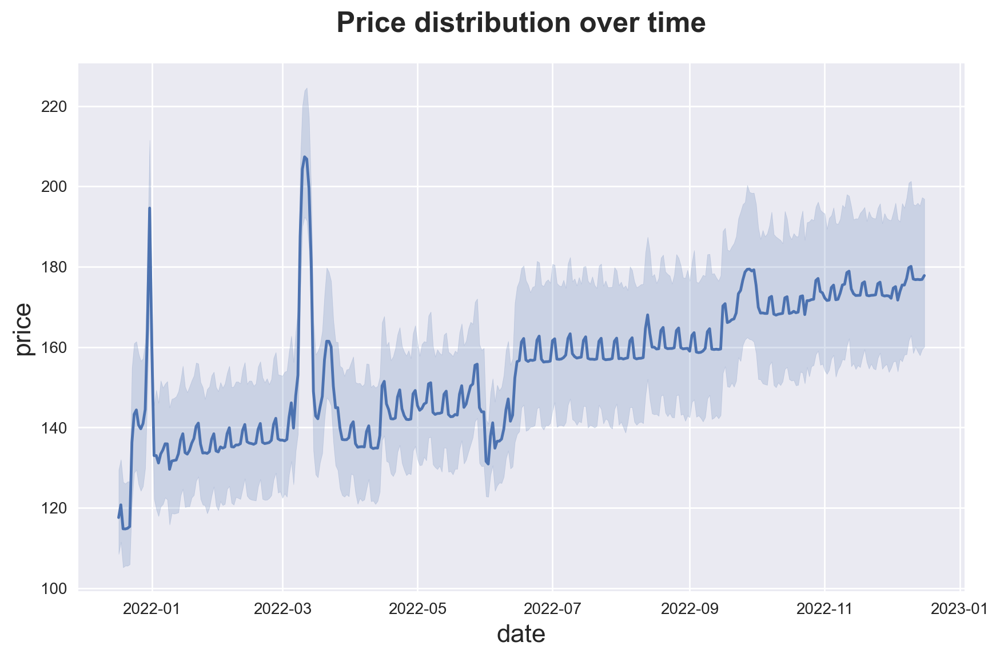

In [23]:
sns.lineplot(data=df, x='date', y='price')\
.set(title="Price distribution over time");

C:\Users\danie\AppData\Local\Temp\ipykernel_1256\1237367165.py:1: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=df, x='date', y='price', hue='neighborhood', ci=None)\


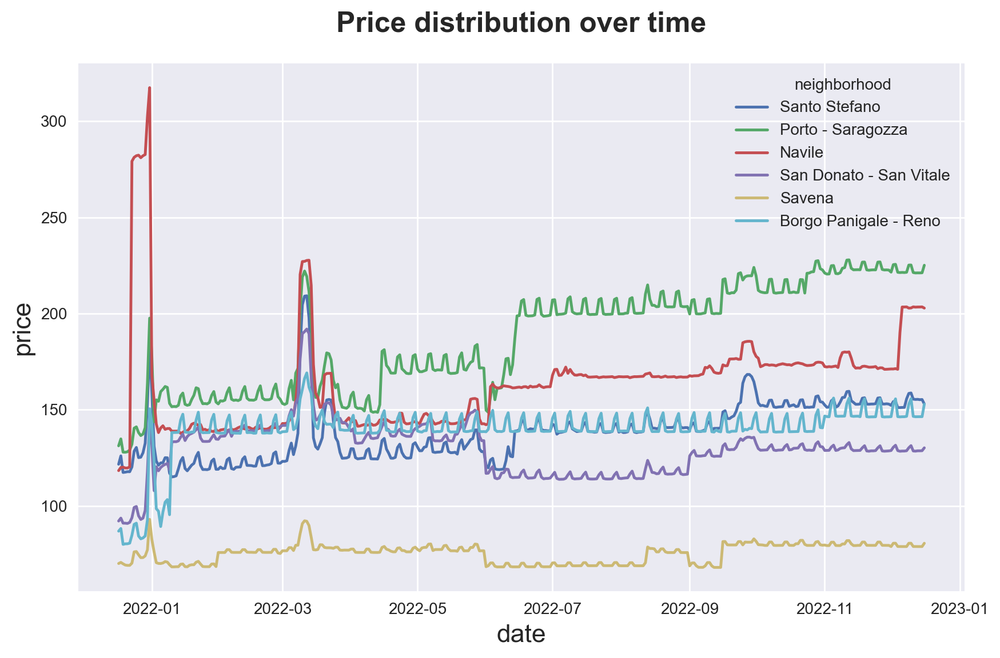

In [24]:
sns.lineplot(data=df, x='date', y='price', hue='neighborhood', ci=None)\
.set(title="Price distribution over time");

In [25]:
df_listings["log_reviews"] = np.log(1 + df_listings["number_of_reviews"])
df_listings["log_rpm"] = np.log(1 + df_listings["reviews_per_month"])

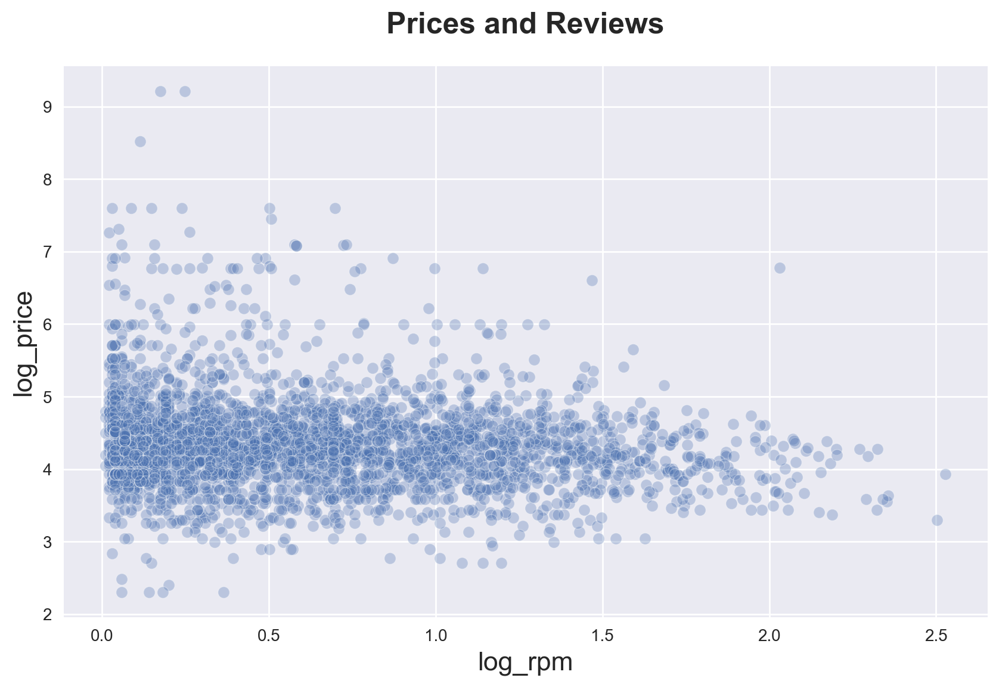

In [26]:
sns.scatterplot(data=df_listings, x="log_rpm", y="log_price", alpha=0.3)\
.set(title='Prices and Reviews');

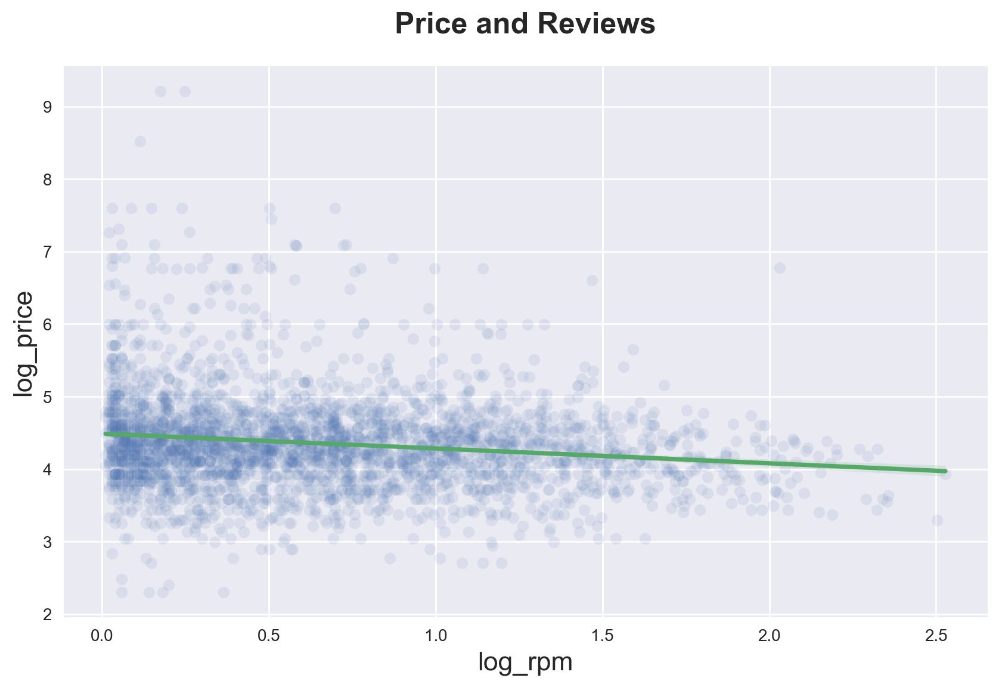

In [27]:
sns.regplot(x="log_rpm", y="log_price", data=df_listings,
            scatter_kws={'alpha':.1},
            line_kws={'color':'C1'})\
.set(title='Price and Reviews');

In [29]:
!pip install binscatter

DEPRECATION: Loading egg at c:\users\danie\appdata\local\programs\python\python311\lib\site-packages\pytz_deprecation_shim-0.1.0.post0-py3.11.egg is deprecated. pip 25.1 will enforce this behaviour change. A possible replacement is to use pip for package installation. Discussion can be found at https://github.com/pypa/pip/issues/12330
DEPRECATION: Loading egg at c:\users\danie\appdata\local\programs\python\python311\lib\site-packages\rpy2-3.5.12-py3.11.egg is deprecated. pip 25.1 will enforce this behaviour change. A possible replacement is to use pip for package installation. Discussion can be found at https://github.com/pypa/pip/issues/12330
DEPRECATION: Loading egg at c:\users\danie\appdata\local\programs\python\python311\lib\site-packages\tzlocal-4.4b1-py3.11.egg is deprecated. pip 25.1 will enforce this behaviour change. A possible replacement is to use pip for package installation. Discussion can be found at https://github.com/pypa/pip/issues/12330
ERROR: Could not find a version

https://github.com/esantorella/binscatter

In [34]:
!git clone https://github.com/esantorella/binscatter.git

Cloning into 'binscatter'...


In [36]:
!cd binscatter

In [37]:
!pip install .

Processing c:\users\danie\appdata\local\programs\microsoft vs code\binscatter
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Created wheel for binscatter: filename=binscatter-1.0.0-py3-none-any.whl size=3090 sha256=b3c41d3398cd6e27735cbe2abfeffd7dc0aa9c04f33d691724eb3334114bebec
  Stored in directory: C:\Users\danie\AppData\Local\Temp\pip-ephem-wheel-cache-wtkaoc2n\wheels\ec\11\82\8f71a26edbdc8efbddba2a6636a2ca9e468fff95afa71b545b
Successfully built binscatter


DEPRECATION: Loading egg at c:\users\danie\appdata\local\programs\python\python311\lib\site-packages\pytz_deprecation_shim-0.1.0.post0-py3.11.egg is deprecated. pip 25.1 will enforce this behaviour change. A possible replacement is to use pip for package installation. Discussion can be found at https://github.com/pypa/pip/issues/12330
DEPRECATION: Loading egg at c:\users\danie\appdata\local\programs\python\python311\lib\site-packages\rpy2-3.5.12-py3.11.egg is deprecated. pip 25.1 will enforce this behaviour change. A possible replacement is to use pip for package installation. Discussion can be found at https://github.com/pypa/pip/issues/12330
DEPRECATION: Loading egg at c:\users\danie\appdata\local\programs\python\python311\lib\site-packages\tzlocal-4.4b1-py3.11.egg is deprecated. pip 25.1 will enforce this behaviour change. A possible replacement is to use pip for package installation. Discussion can be found at https://github.com/pypa/pip/issues/12330


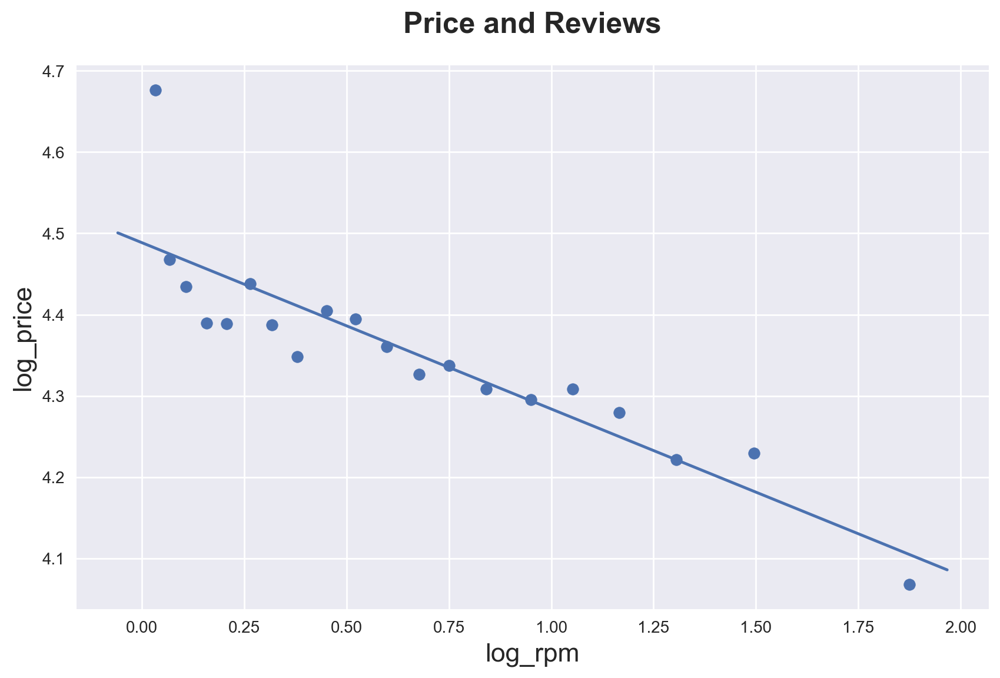

In [38]:
import binscatter

# Remove nans
temp = df_listings[["log_rpm", "log_price"]].dropna()

# Binned scatter plot of Wage vs Tenure
fig, ax = plt.subplots()
ax.binscatter(temp["log_rpm"], temp["log_price"]);
ax.set_title('Price and Reviews');

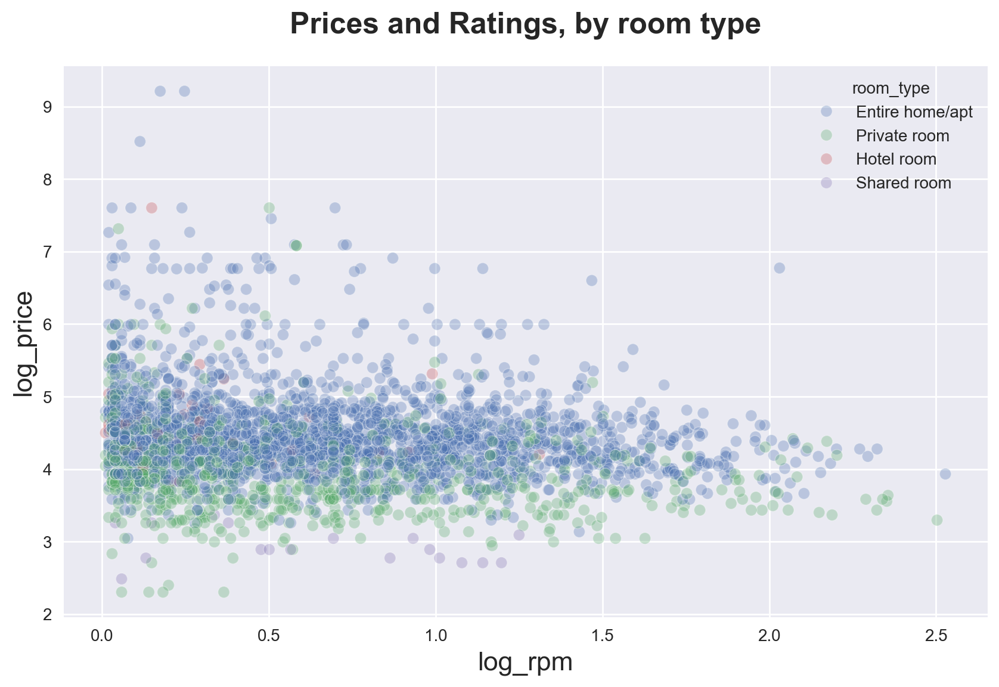

In [39]:
sns.scatterplot(data=df_listings, x="log_rpm", y="log_price", 
                hue="room_type", alpha=0.3)\
.set(title="Prices and Ratings, by room type");

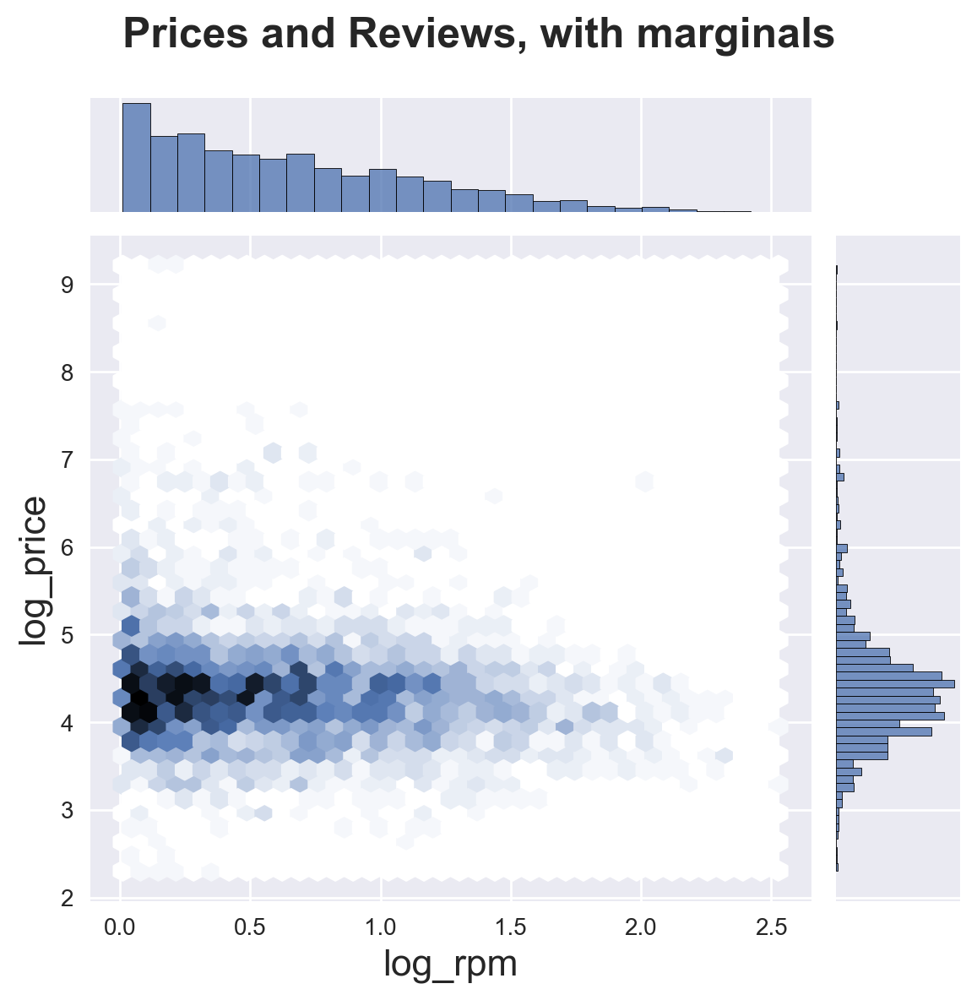

In [40]:
sns.jointplot(data=df_listings, x="log_rpm", y="log_price", kind="hex")\
.fig.suptitle("Prices and Reviews, with marginals")  
plt.subplots_adjust(top=0.9);

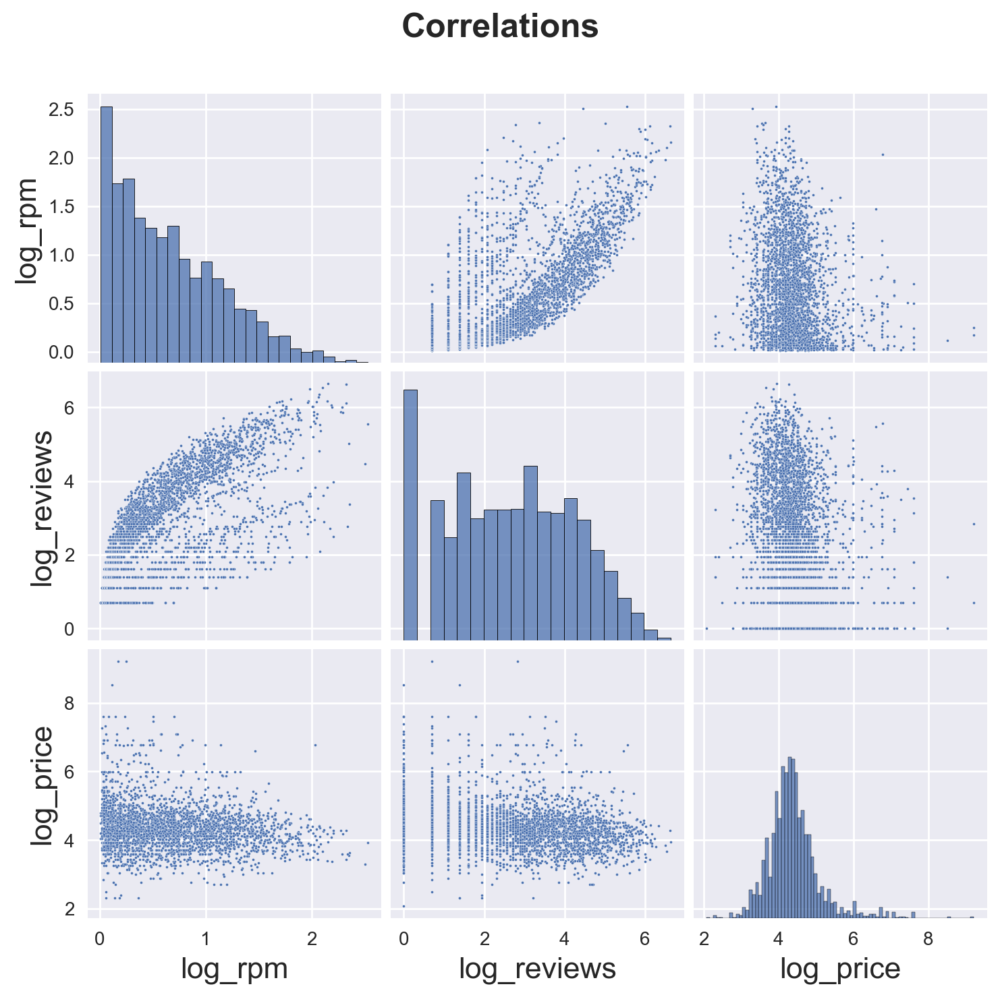

In [41]:
sns.pairplot(data=df_listings,
             vars=["log_rpm", "log_reviews", "log_price"],
             plot_kws={'s':2})\
.fig.suptitle("Correlations");
plt.subplots_adjust(top=0.9)

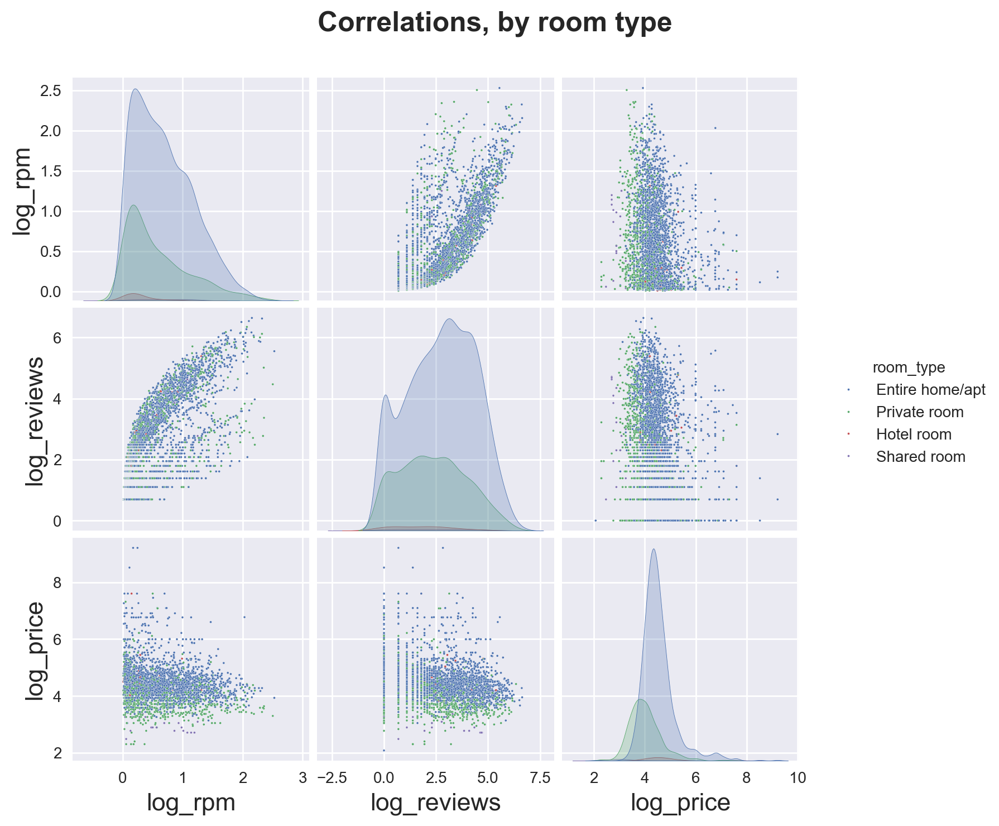

In [42]:
sns.pairplot(data=df_listings,
             vars=["log_rpm", "log_reviews", "log_price"],
             hue='room_type',
             plot_kws={'s':2})\
.fig.suptitle("Correlations, by room type");
plt.subplots_adjust(top=0.9)

C:\Users\danie\AppData\Local\Temp\ipykernel_1256\2204523115.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(df.corr(), vmin=-1, vmax=1, linewidths=.5, cmap="RdBu")\


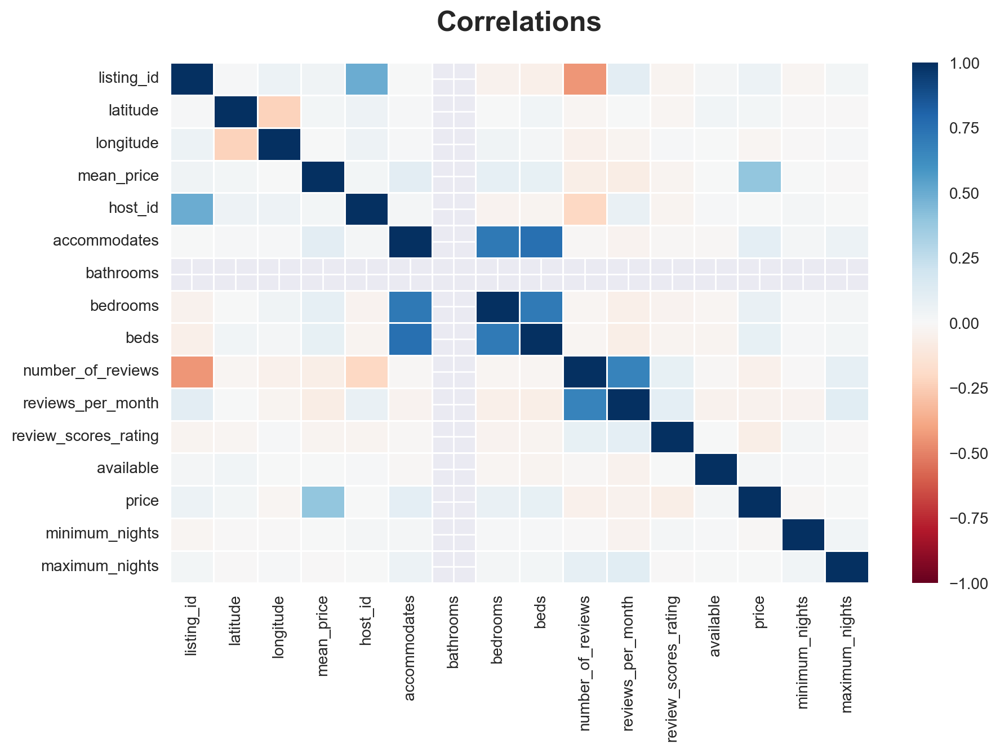

In [43]:
# Plot
sns.heatmap(df.corr(), vmin=-1, vmax=1, linewidths=.5, cmap="RdBu")\
 .set(title="Correlations");

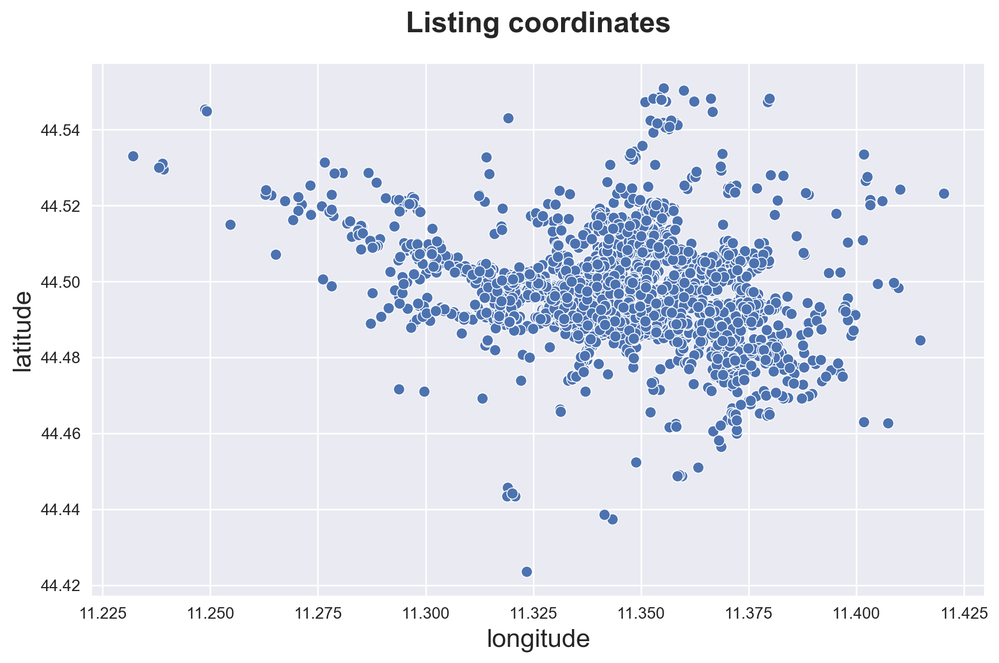

In [44]:
sns.scatterplot(data=df_listings, x="longitude", y="latitude")\
.set(title='Listing coordinates');

In [45]:
geom = geopandas.points_from_xy(df_listings.longitude, df_listings.latitude)
gdf = geopandas.GeoDataFrame(
    df_listings, 
    geometry=geom,
    crs=4326).to_crs(3857)

<Axes: title={'center': 'Bologna, Emilia-Romagna, Italia'}, xlabel='X', ylabel='Y'>

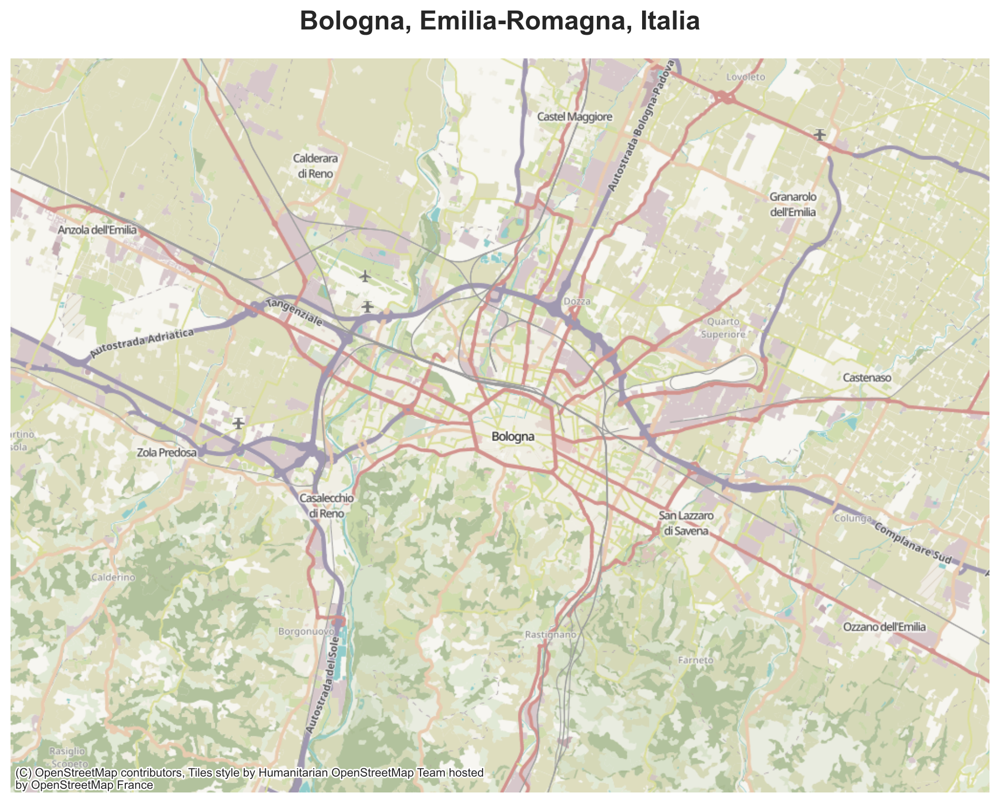

In [51]:
import contextily as cx

# Buscar por Bologna e exibir o mapa
bologna = cx.Place("Bologna")
bologna.plot()


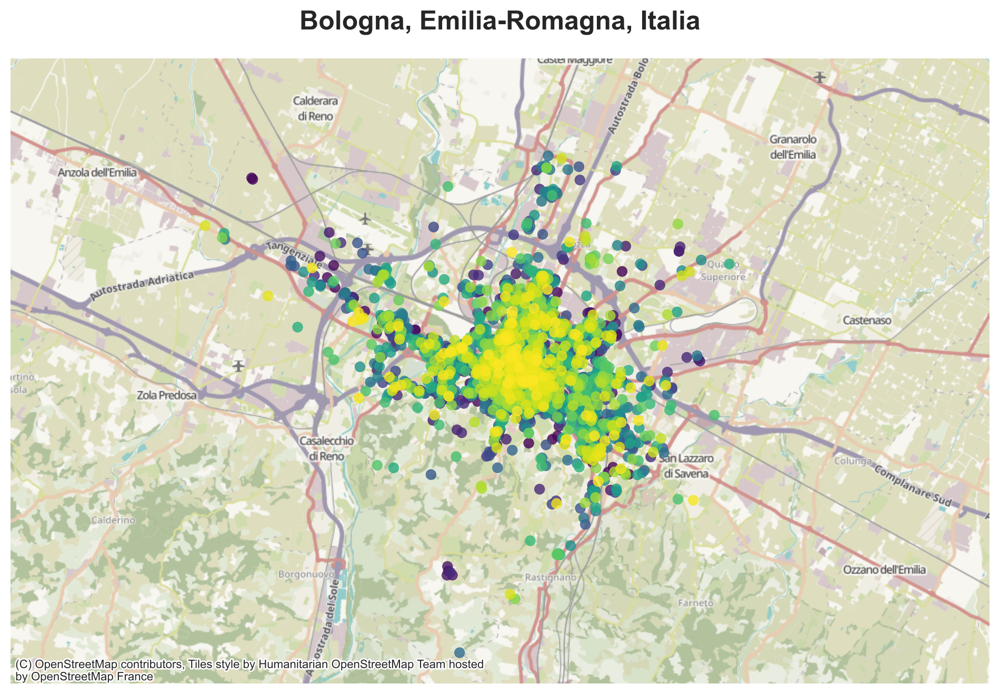

In [52]:
ax = bologna.plot()
ax.set_ylim([5530000, 5555000])
gdf.plot(ax=ax, c=df_listings['mean_price'], cmap='viridis', alpha=0.8);